# Project task - Solar Energy Production
This notebook will contain the exploratory data analysis, all manipulation and cleaning of the given datasets and finally the creation of predictions using the different ML models

In [1]:
#importing necessary datasets
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
%matplotlib inline

#Setting max display options to avoid local crashes
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

## Reading in the datasets

In [2]:
Y_train_a = pd.read_parquet('data/A/train_targets.parquet')
Y_train_b = pd.read_parquet('data/B/train_targets.parquet')
Y_train_c = pd.read_parquet('data/C/train_targets.parquet')

In [3]:
X_train_estimated_a = pd.read_parquet('data/A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('data/B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('data/C/X_train_estimated.parquet')

In [4]:
X_train_observed_a = pd.read_parquet('data/A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('data/B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('data/C/X_train_observed.parquet')

In [5]:
X_test_estimated_a = pd.read_parquet('data/A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('data/B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('data/C/X_test_estimated.parquet')

### Combining the datasets
A seperate combined dataset will be made for the A, B and C location.\
Each location will have a X dataset (containing only feature values) and a complete training dataset (X_train combined with the Y_train values) which can be used to check for feature correlation. 


*Note: The resolution is different between the X and Y datasets, as Y each row in Y contains an hour and each row in X is per 15 minutes. To begin with the X datset will be naivly changed to have a resolution of every hour aswell. However we will later explore feature exploration techniques to retain more data from X by artifically increasing the resolution of the Y data*

#### Location A

In [6]:
#Create the X dataset for location A
X_train_estimated_a["estimated"] = 1.0
X_test_estimated_a["estimated"] = 1.0
X_train_observed_a["estimated"] = 0.0
X_train_observed_a["date_calc"] = X_train_observed_a["date_forecast"].copy() #date calc column added to observed data so that observed and estimated has equal nr cols

X_train_estimated_a["train/test"] = "train"
X_train_observed_a["train/test"] = "train"
X_test_estimated_a["train/test"] = "test"

X_all_a= pd.concat([X_train_observed_a, X_train_estimated_a, X_test_estimated_a], ignore_index=True)
X_all_a.set_index('date_forecast', inplace=True)

*Create the complete training set for A*

In [7]:
#Create the complete train dataset for location A
train_all_a = pd.concat([X_train_observed_a.drop("train/test", axis=1), X_train_estimated_a.drop("train/test", axis=1)], ignore_index=True)
train_all_a.set_index('date_forecast', inplace=True)

#remove all non hourly values
train_all_a = train_all_a[train_all_a.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_a.set_index('time', inplace=True)

#Concatenate with y data
train_all_a = pd.concat([train_all_a, Y_train_a], axis=1)

In [8]:
train_all_a.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,date_calc,pv_measurement
2019-06-02 22:00:00,7.7,1.230,1744.900024,0.000000,0.0,1744.900024,0.0,280.299988,0.0,0.000000,0.0,0.0,98.699997,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1006.799988,0.0,0.0,994.200012,1000.299988,0.0,0.0,73.099998,1006.299988,NaN,0.0,0.0,-0.0,0.1,342.834015,-3.202,0.0,285.899994,100.0,39640.101562,3.7,-3.6,-0.8,-0.0,0.0,2019-06-02 22:00:00,0.00
2019-06-02 23:00:00,7.7,1.225,1703.599976,0.000000,0.0,1703.599976,0.0,280.299988,0.0,0.000000,0.0,0.0,99.599998,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1005.500000,0.0,0.0,993.000000,999.000000,0.0,0.0,69.199997,1005.000000,NaN,0.0,0.0,-0.0,0.2,356.742004,-4.393,0.0,286.799988,100.0,41699.898438,3.5,-3.5,0.0,-0.0,0.0,2019-06-02 23:00:00,0.00
2019-06-03 00:00:00,7.7,1.221,1668.099976,0.000000,0.0,1668.099976,0.0,280.200012,0.0,0.000000,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1004.599976,0.0,0.0,992.099976,998.099976,0.0,0.1,66.000000,1004.099976,NaN,0.0,0.0,-0.0,0.2,9.741000,-3.910,0.0,287.000000,100.0,20473.000000,3.2,-3.1,0.7,-0.0,0.0,2019-06-03 00:00:00,0.00
2019-06-03 01:00:00,8.2,1.218,1388.400024,0.000000,0.0,1388.400024,0.0,281.299988,0.0,0.000000,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1004.400024,0.0,0.0,991.799988,997.799988,0.0,0.2,71.099998,1003.799988,NaN,0.0,0.0,-0.0,0.7,23.541000,-1.986,0.0,286.899994,100.0,2104.600098,2.8,-2.7,0.8,-0.0,0.0,2019-06-03 01:00:00,0.00
2019-06-03 02:00:00,8.8,1.219,1108.500000,6546.899902,9.8,1108.500000,0.0,282.299988,4.3,7743.299805,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1003.400024,0.0,0.0,990.900024,996.900024,0.0,0.1,78.500000,1002.900024,NaN,0.0,0.0,-0.0,0.3,37.040001,1.401,0.0,286.500000,100.0,2681.600098,2.7,-2.5,1.0,-0.0,0.0,2019-06-03 02:00:00,19.36


#### Location B

In [9]:
#Combine all data from B
X_train_estimated_b["estimated"] = 1.0
X_test_estimated_b["estimated"] = 1.0
X_train_observed_b["estimated"] = 0.0
X_train_observed_b["date_calc"] = X_train_observed_b["date_forecast"].copy()

X_train_estimated_b["train/test"] = "train"
X_train_observed_b["train/test"] = "train"
X_test_estimated_b["train/test"] = "test"

X_all_b= pd.concat([X_train_observed_b, X_train_estimated_b, X_test_estimated_b], ignore_index=True)
X_all_b.set_index('date_forecast', inplace=True)

*Create the complete training set*

In [10]:
#Create the complete train dataset for location A
train_all_b = pd.concat([X_train_observed_b.drop("train/test", axis=1), X_train_estimated_b.drop("train/test", axis=1)], ignore_index=True)
train_all_b.set_index('date_forecast', inplace=True)
#remove all non hourly values
train_all_b = train_all_b[train_all_b.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_b.set_index('time', inplace=True)

#Concatenate with y data
train_all_b = pd.concat([train_all_b, Y_train_b], axis=1)

In [11]:
train_all_b.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,date_calc,pv_measurement
2018-12-31 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,0.0
2019-01-01 00:00:00,5.6,1.239,1226.400024,0.0,0.0,1226.400024,0.0,275.399994,0.0,0.0,0.0,0.0,69.599998,7.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,987.400024,0.00,0.0,974.500000,980.599976,0.0,0.0,89.199997,986.599976,NaN,0.0,0.0,-0.0,0.0,12.985000,-49.139999,0.0,278.399994,73.900002,19275.900391,2.5,1.1,2.2,-0.0,0.0,2019-01-01 00:00:00,0.0
2019-01-01 01:00:00,5.4,1.241,1157.599976,0.0,0.0,1157.599976,0.0,274.700012,0.0,0.0,0.0,0.0,98.099998,7.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,986.299988,0.05,1.0,973.400024,979.500000,0.0,0.0,88.900002,985.599976,NaN,0.0,0.0,-0.0,0.1,33.275002,-46.497002,0.0,278.000000,99.400002,12777.299805,3.4,1.3,3.1,-0.0,0.0,2019-01-01 01:00:00,0.0
2019-01-01 02:00:00,5.5,1.238,1087.599976,0.0,0.0,1087.599976,0.0,275.000000,0.0,0.0,0.0,0.0,96.300003,7.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,985.900024,0.00,0.0,973.000000,979.000000,0.0,0.0,87.599998,985.099976,NaN,0.0,0.0,-0.0,0.1,51.573002,-41.963001,0.0,278.200012,98.400002,12776.700195,3.8,2.0,3.3,-0.0,0.0,2019-01-01 02:00:00,0.0
2019-01-01 03:00:00,5.3,1.240,1016.400024,0.0,0.0,1016.400024,0.0,274.500000,0.0,0.0,0.0,0.0,97.199997,7.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,986.099976,0.00,0.0,973.200012,979.200012,0.0,0.0,86.800003,985.299988,NaN,0.0,0.0,-0.0,0.1,67.794998,-36.167000,0.2,277.799988,97.800003,8399.900391,4.3,2.4,3.6,-0.0,0.0,2019-01-01 03:00:00,0.0


In [12]:
#Drop the first row, as it is not in the X data
train_all_b.drop("2018-12-31 23:00:00", inplace=True)

#### Location C

In [13]:
#Combine all data from C
X_train_estimated_c["estimated"] = 1.0
X_test_estimated_c["estimated"] = 1.0
X_train_observed_c["estimated"] = 0.0
X_train_observed_c["date_calc"] = X_train_observed_c["date_forecast"].copy()
X_train_estimated_c["train/test"] = "train"
X_train_observed_c["train/test"] = "train"
X_test_estimated_c["train/test"] = "test"

X_all_c= pd.concat([X_train_observed_c, X_train_estimated_c, X_test_estimated_c], ignore_index=True)
X_all_c.set_index('date_forecast', inplace=True)

*Create Complete training data for location C*

In [14]:
#Create the complete train dataset for location A
train_all_c = pd.concat([X_train_observed_c.drop("train/test", axis=1), X_train_estimated_c.drop("train/test", axis=1)], ignore_index=True)
train_all_c.set_index('date_forecast', inplace=True)
#remove all non hourly values
train_all_c = train_all_c[train_all_c.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_c.set_index('time', inplace=True)

#Concatenate with y data
train_all_c = pd.concat([train_all_c, Y_train_c], axis=1)

In [15]:
train_all_c.drop("2018-12-31 23:00:00", inplace=True)

#### Lets make a combined dataset for all locations
This is in order to quickly check correlations and get a brief overview about all locations

In [16]:
copy_a = X_all_a.copy()
copy_b = X_all_b.copy()
copy_c = X_all_c.copy()

copy_a["location"] = "A"
copy_b["location"] = "B"
copy_c["location"] = "C"
X_all = pd.concat([copy_a, copy_b, copy_c])

In [17]:
copy_a_train = train_all_a.copy()
copy_b_train = train_all_b.copy()
copy_c_train = train_all_c.copy()

copy_a_train["location"] = "A"
copy_b_train["location"] = "B"
copy_c_train["location"] = "C"

train_all = pd.concat([copy_a_train, copy_b_train, copy_c_train])

In [18]:
train_all.head(-20)

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,date_calc,pv_measurement,location
2019-06-02 22:00:00,7.7,1.230,1744.900024,0.000000,0.0,1744.900024,0.0,280.299988,0.0,0.000000,0.0,0.0,98.699997,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1006.799988,0.0,0.0,994.200012,1000.299988,0.0,0.0,73.099998,1006.299988,NaN,0.0,0.0,-0.0,0.1,342.834015,-3.202,0.0,285.899994,100.000000,39640.101562,3.7,-3.6,-0.8,-0.0,0.0,2019-06-02 22:00:00,0.00,A
2019-06-02 23:00:00,7.7,1.225,1703.599976,0.000000,0.0,1703.599976,0.0,280.299988,0.0,0.000000,0.0,0.0,99.599998,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1005.500000,0.0,0.0,993.000000,999.000000,0.0,0.0,69.199997,1005.000000,NaN,0.0,0.0,-0.0,0.2,356.742004,-4.393,0.0,286.799988,100.000000,41699.898438,3.5,-3.5,0.0,-0.0,0.0,2019-06-02 23:00:00,0.00,A
2019-06-03 00:00:00,7.7,1.221,1668.099976,0.000000,0.0,1668.099976,0.0,280.200012,0.0,0.000000,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1004.599976,0.0,0.0,992.099976,998.099976,0.0,0.1,66.000000,1004.099976,NaN,0.0,0.0,-0.0,0.2,9.741000,-3.910,0.0,287.000000,100.000000,20473.000000,3.2,-3.1,0.7,-0.0,0.0,2019-06-03 00:00:00,0.00,A
2019-06-03 01:00:00,8.2,1.218,1388.400024,0.000000,0.0,1388.400024,0.0,281.299988,0.0,0.000000,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1004.400024,0.0,0.0,991.799988,997.799988,0.0,0.2,71.099998,1003.799988,NaN,0.0,0.0,-0.0,0.7,23.541000,-1.986,0.0,286.899994,100.000000,2104.600098,2.8,-2.7,0.8,-0.0,0.0,2019-06-03 01:00:00,0.00,A
2019-06-03 02:00:00,8.8,1.219,1108.500000,6546.899902,9.8,1108.500000,0.0,282.299988,4.3,7743.299805,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1003.400024,0.0,0.0,990.900024,996.900024,0.0,0.1,78.500000,1002.900024,NaN,0.0,0.0,-0.0,0.3,37.040001,1.401,0.0,286.500000,100.000000,2681.600098,2.7,-2.5,1.0,-0.0,0.0,2019-06-03 02:00:00,19.36,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-29 23:00:00,4.2,1.276,3086.600098,0.000000,0.0,772.799988,0.0,271.399994,0.0,0.000000,0.0,0.0,86.699997,24.0,1.2,0.0,1.2,1.2,1.2,0.0,1.0,1010.400024,0.0,0.0,994.799988,1001.000000,0.0,0.0,76.800003,1007.299988,NaN,0.0,0.0,-0.0,0.0,356.588013,-12.232,0.0,274.500000,86.699997,24827.900391,3.9,2.8,2.8,-0.0,1.0,2023-04-28 07:00:04,-0.00,C
2023-04-30 00:00:00,4.2,1.281,2265.600098,0.000000,0.0,1152.800049,0.0,271.100006,0.0,0.000000,0.0,0.0,100.000000,24.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1011.500000,0.0,0.0,995.799988,1002.000000,0.0,0.0,80.599998,1008.299988,NaN,0.0,0.0,0.0,0.0,10.513000,-11.531,0.0,273.799988,100.000000,27223.699219,3.7,2.1,3.0,-0.0,1.0,2023-04-29 07:00:05,0.00,C
2023-04-30 01:00:00,4.1,1.278,2831.399902,0.000000,0.0,1073.599976,0.0,271.100006,0.0,0.000000,0.0,0.0,100.000000,24.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1011.099976,0.0,0.0,995.400024,1001.700012,0.0,0.0,77.199997,1007.900024,NaN,0.0,0.0,0.0,0.1,25.165001,-9.470,0.0,274.200012,100.000000,26171.500000,4.1,2.5,3.3,-0.0,1.0,2023-04-29 07:00:05,0.00,C
2023-04-30 02:00:00,4.1,1.277,902.000000,0.000000,0.0,810.299988,0.0,271.000000,0.0,0.000000,0.0,0.0,99.099998,24.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1011.099976,0.0,0.0,995.299988,1001.500000,0.0,0.0,77.0000

## Exploratory Data Analysis

Lets start by making some quick graphs of the all the data combined

In [19]:
X_all.isnull().sum()

absolute_humidity_2m:gm3               0
air_density_2m:kgm3                    0
ceiling_height_agl:m               75543
clear_sky_energy_1h:J                  0
clear_sky_rad:W                        0
cloud_base_agl:m                   31862
dew_or_rime:idx                        0
dew_point_2m:K                         0
diffuse_rad:W                          0
diffuse_rad_1h:J                       0
direct_rad:W                           0
direct_rad_1h:J                        0
effective_cloud_cover:p                0
elevation:m                            0
fresh_snow_12h:cm                      0
fresh_snow_1h:cm                       0
fresh_snow_24h:cm                      0
fresh_snow_3h:cm                       0
fresh_snow_6h:cm                       0
is_day:idx                             0
is_in_shadow:idx                       0
msl_pressure:hPa                       0
precip_5min:mm                         0
precip_type_5min:idx                   0
pressure_100m:hP

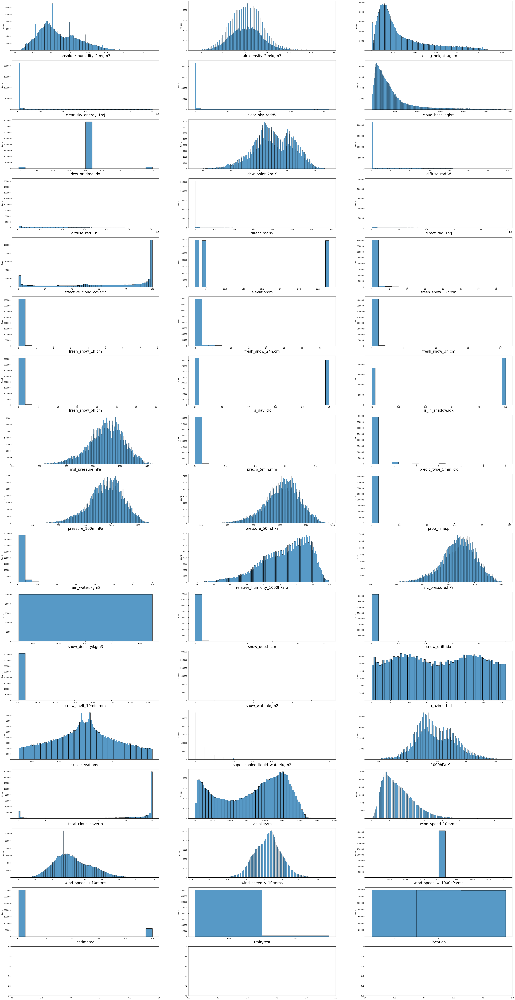

In [20]:
fig, axes = plt.subplots(nrows=17, ncols=3, figsize=(50, 100))
axes = axes.flatten()

for i, column in enumerate(X_all.drop("date_calc", axis=1).columns):
    sns.histplot(data=X_all[column], kde=False, ax=axes[i])
    axes[i].set_xlabel(column, fontsize = 20)


*Observations*
- Based on this is seems like snow density is completely filled with Nan values
- We have a random dip in the date forecast at the end of 2022
- Snow Density has VERY low count compared to the other features
- All the radian features have a strange distribution

#### Lets check the train data

In [21]:
fig, axes = plt.subplots(nrows=16, ncols=3, figsize=(40, 140), dpi=200)
axes = axes.flatten()

for i, column in enumerate(train_all.drop("date_calc", axis=1).columns):
    sns.histplot(data=train_all[column], kde=False, ax=axes[i])
    axes[i].set_xlabel(column, fontsize = 20)


Plotting the PV-measurements for the different datasets

In [22]:
train_all["pv_measurement"].describe()

count    93023.000000
mean       287.022737
std        766.411327
min         -0.000000
25%          0.000000
50%          0.000000
75%        172.920000
max       5733.420000
Name: pv_measurement, dtype: float64

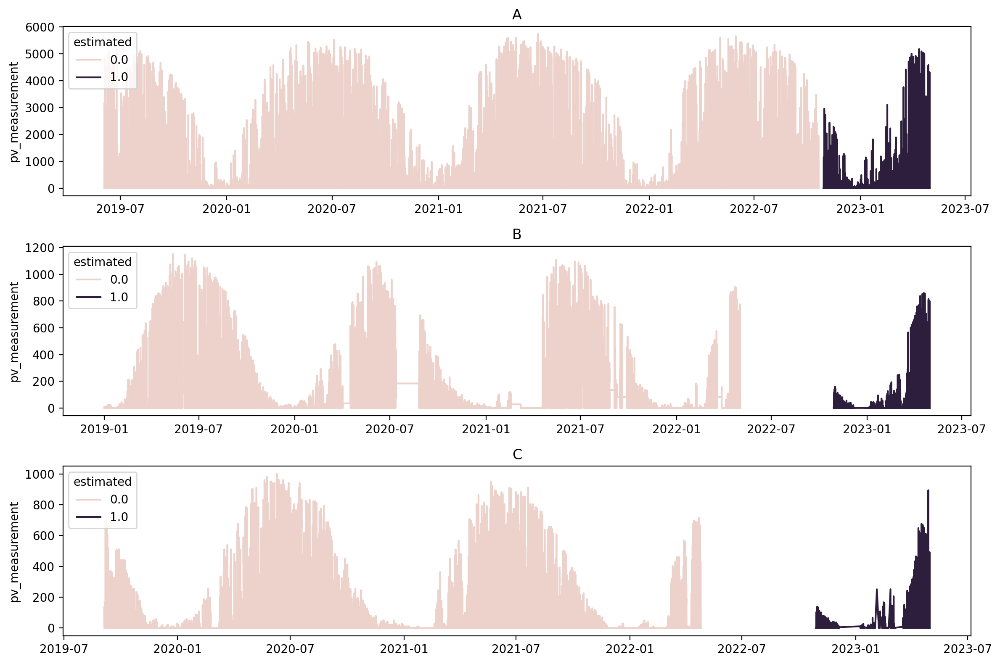

In [23]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(12, 8), dpi=200)
feature = "pv_measurement"
sns.lineplot(data = train_all_a, y=feature, x = train_all_a.index, ax=axs[0], hue="estimated")
sns.lineplot(data = train_all_b, y=feature, x = train_all_b.index, ax=axs[1], hue="estimated")
sns.lineplot(data = train_all_c, y=feature, x = train_all_c.index, ax=axs[2], hue="estimated")
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

Already we see that season plays a large role in the PV measurement!
This should be added as a feature (maybe month?)
Maybe the date forecast could be used as a feature to somehowe encode this info, or make a month feature from it!

#### Lets start to look at the correlation between the data and the target y values (PV measurement)

In [20]:
plt.figure(figsize = (50, 60), dpi=200)
sns.heatmap(train_all.drop(["location"], axis=1).corr(), annot = True); 

In [21]:
plt.figure(figsize = (50,90), dpi=200)
sns.heatmap(train_all.drop(["location"], axis=1).corr()[["pv_measurement"]], annot = True); 

In [22]:
train_all.drop(["location"], axis=1).corr()[["pv_measurement"]]

,pv_measurement
absolute_humidity_2m:gm3,0.212681
air_density_2m:kgm3,-0.275082
ceiling_height_agl:m,0.125216
clear_sky_energy_1h:J,0.581296
clear_sky_rad:W,0.596610
cloud_base_agl:m,0.112066
dew_or_rime:idx,-0.009610
dew_point_2m:K,0.214575
diffuse_rad:W,0.521091
diffuse_rad_1h:J,0.510671


*Notes*
- wind_speed_w_1000hPa:ms seems to not be very important
- All snow values seem to not be very important (except maybe snow depth)
- dew_or_rime:idx is very useless

## Looking for outliers

## Feature Engineering

## Cleaning Data

In [24]:
X_all.isnull().sum()

absolute_humidity_2m:gm3               0
air_density_2m:kgm3                    0
ceiling_height_agl:m               75543
clear_sky_energy_1h:J                  0
clear_sky_rad:W                        0
cloud_base_agl:m                   31862
dew_or_rime:idx                        0
dew_point_2m:K                         0
diffuse_rad:W                          0
diffuse_rad_1h:J                       0
direct_rad:W                           0
direct_rad_1h:J                        0
effective_cloud_cover:p                0
elevation:m                            0
fresh_snow_12h:cm                      0
fresh_snow_1h:cm                       0
fresh_snow_24h:cm                      0
fresh_snow_3h:cm                       0
fresh_snow_6h:cm                       0
is_day:idx                             0
is_in_shadow:idx                       0
msl_pressure:hPa                       0
precip_5min:mm                         0
precip_type_5min:idx                   0
pressure_100m:hP

In [20]:
train_all.isnull().sum()

absolute_humidity_2m:gm3             72
air_density_2m:kgm3                  72
ceiling_height_agl:m              21673
clear_sky_energy_1h:J                72
clear_sky_rad:W                      72
cloud_base_agl:m                   9229
dew_or_rime:idx                      72
dew_point_2m:K                       72
diffuse_rad:W                        72
diffuse_rad_1h:J                     72
direct_rad:W                         72
direct_rad_1h:J                      72
effective_cloud_cover:p              72
elevation:m                          72
fresh_snow_12h:cm                    72
fresh_snow_1h:cm                     72
fresh_snow_24h:cm                    72
fresh_snow_3h:cm                     72
fresh_snow_6h:cm                     72
is_day:idx                           72
is_in_shadow:idx                     72
msl_pressure:hPa                     72
precip_5min:mm                       72
precip_type_5min:idx                 72
pressure_100m:hPa                    72


*Notes*
- X_all has virtually no Nan values (strange)
- training data always has 72 Nan (something went wrong in concatination)

#### Per Location

In [25]:
X_all_a.isnull().sum()

absolute_humidity_2m:gm3               0
air_density_2m:kgm3                    0
ceiling_height_agl:m               26959
clear_sky_energy_1h:J                  0
clear_sky_rad:W                        0
cloud_base_agl:m                   10458
dew_or_rime:idx                        0
dew_point_2m:K                         0
diffuse_rad:W                          0
diffuse_rad_1h:J                       0
direct_rad:W                           0
direct_rad_1h:J                        0
effective_cloud_cover:p                0
elevation:m                            0
fresh_snow_12h:cm                      0
fresh_snow_1h:cm                       0
fresh_snow_24h:cm                      0
fresh_snow_3h:cm                       0
fresh_snow_6h:cm                       0
is_day:idx                             0
is_in_shadow:idx                       0
msl_pressure:hPa                       0
precip_5min:mm                         0
precip_type_5min:idx                   0
pressure_100m:hP

In [26]:
train_all_a.isnull().sum()

absolute_humidity_2m:gm3             24
air_density_2m:kgm3                  24
ceiling_height_agl:m               7802
clear_sky_energy_1h:J                24
clear_sky_rad:W                      24
cloud_base_agl:m                   3088
dew_or_rime:idx                      24
dew_point_2m:K                       24
diffuse_rad:W                        24
diffuse_rad_1h:J                     24
direct_rad:W                         24
direct_rad_1h:J                      24
effective_cloud_cover:p              24
elevation:m                          24
fresh_snow_12h:cm                    24
fresh_snow_1h:cm                     24
fresh_snow_24h:cm                    24
fresh_snow_3h:cm                     24
fresh_snow_6h:cm                     24
is_day:idx                           24
is_in_shadow:idx                     24
msl_pressure:hPa                     24
precip_5min:mm                       24
precip_type_5min:idx                 24
pressure_100m:hPa                    24


In [26]:
train_all_b.isnull().sum()

absolute_humidity_2m:gm3             24
air_density_2m:kgm3                  24
ceiling_height_agl:m               6655
clear_sky_energy_1h:J                24
clear_sky_rad:W                      24
cloud_base_agl:m                   2810
dew_or_rime:idx                      24
dew_point_2m:K                       24
diffuse_rad:W                        24
diffuse_rad_1h:J                     24
direct_rad:W                         24
direct_rad_1h:J                      24
effective_cloud_cover:p              24
elevation:m                          24
fresh_snow_12h:cm                    24
fresh_snow_1h:cm                     24
fresh_snow_24h:cm                    24
fresh_snow_3h:cm                     24
fresh_snow_6h:cm                     24
is_day:idx                           24
is_in_shadow:idx                     24
msl_pressure:hPa                     24
precip_5min:mm                       24
precip_type_5min:idx                 24
pressure_100m:hPa                    24


In [28]:
train_all_c.isnull().sum()

absolute_humidity_2m:gm3             24
air_density_2m:kgm3                  24
ceiling_height_agl:m               7216
clear_sky_energy_1h:J                24
clear_sky_rad:W                      24
cloud_base_agl:m                   3331
dew_or_rime:idx                      24
dew_point_2m:K                       24
diffuse_rad:W                        24
diffuse_rad_1h:J                     24
direct_rad:W                         24
direct_rad_1h:J                      24
effective_cloud_cover:p              24
elevation:m                          24
fresh_snow_12h:cm                    24
fresh_snow_1h:cm                     24
fresh_snow_24h:cm                    24
fresh_snow_3h:cm                     24
fresh_snow_6h:cm                     24
is_day:idx                           24
is_in_shadow:idx                     24
msl_pressure:hPa                     24
precip_5min:mm                       24
precip_type_5min:idx                 24
pressure_100m:hPa                    24


*Notes*
Seems like an extra 24 rows is added for each dataframe when combining them the pv-measurement.


#### Lets find what rows cause our nan values

We clearly have an extra day of pv measurements, without weather forecasts for it.

In [27]:
train_all_a.drop(train_all_a[train_all_a["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)

In [28]:
train_all_a.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m               7778
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   3064
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


Lets repeat for all the dataframes

In [29]:
train_all_b.drop(train_all_b[train_all_b["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)
train_all_c.drop(train_all_c[train_all_c["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)

In [30]:
train_all_b.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m               6631
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   2786
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


In [29]:
train_all_c.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m               7192
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   3307
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


In [31]:
train_all.drop(train_all[train_all["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)
train_all.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m              21601
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   9157
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


In [33]:
train_all.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 101290 entries, 2019-06-02 22:00:00 to 2023-04-30 23:00:00
Data columns (total 49 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   absolute_humidity_2m:gm3        101290 non-null  float32       
 1   air_density_2m:kgm3             101290 non-null  float32       
 2   ceiling_height_agl:m            79689 non-null   float32       
 3   clear_sky_energy_1h:J           101290 non-null  float32       
 4   clear_sky_rad:W                 101290 non-null  float32       
 5   cloud_base_agl:m                92133 non-null   float32       
 6   dew_or_rime:idx                 101290 non-null  float32       
 7   dew_point_2m:K                  101290 non-null  float32       
 8   diffuse_rad:W                   101290 non-null  float32       
 9   diffuse_rad_1h:J                101290 non-null  float32       
 10  direct_rad:W          

#### Continued cleaning

The remaining column with alot of missing values are:
- ceiling_height_agl:m 
- cloud_base_agl:m 
- snow_density:kgm3
- pv_measurement

We now have the option of attempting to somehow fill inn these missing values with averages, predictions etc.


#### plotting cols with alot of missing values

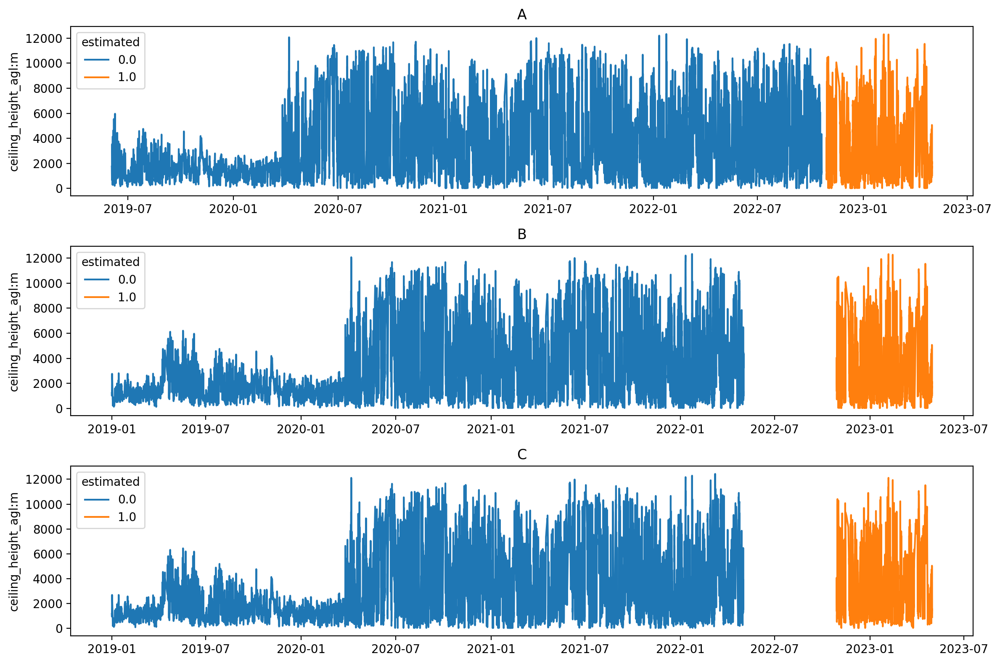

In [35]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(12, 8), dpi=200)
feature = "ceiling_height_agl:m"
sns.lineplot(data = train_all_a, y=feature, x = train_all_a.index, ax=axs[0], hue="estimated")
sns.lineplot(data = train_all_b, y=feature, x = train_all_b.index, ax=axs[1], hue="estimated")
sns.lineplot(data = train_all_c, y=feature, x = train_all_c.index, ax=axs[2], hue="estimated")
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

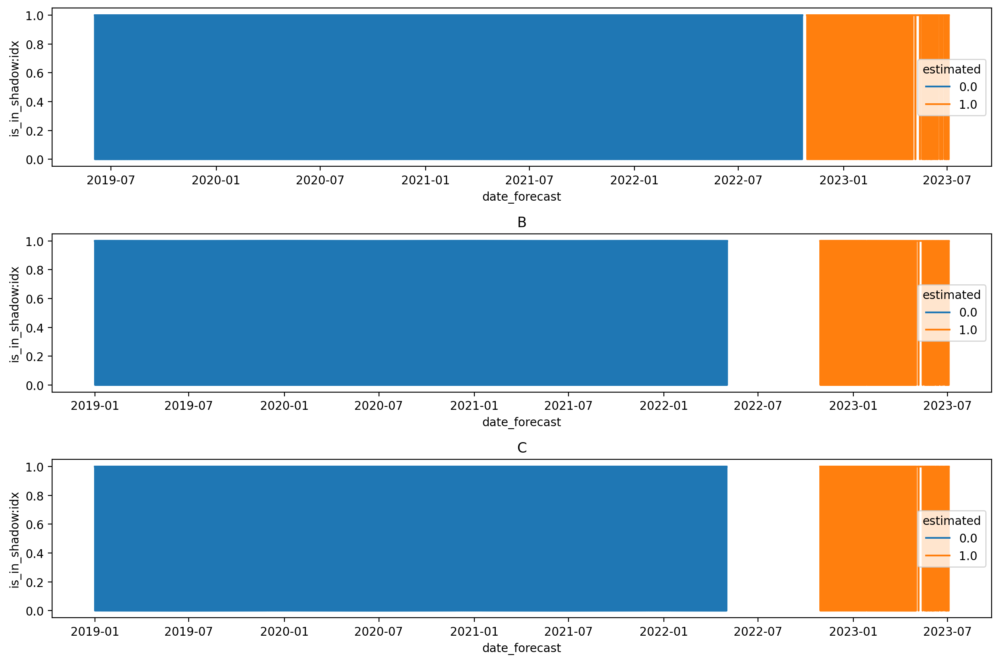

In [36]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(12, 8), dpi=200)
feature = "is_in_shadow:idx"
sns.lineplot(data = X_all[X_all["location"] == "A"], y=feature, x = X_all[X_all["location"] == "A"].index, ax=axs[0], hue="estimated")
sns.lineplot(data = X_all[X_all["location"] == "B"], y=feature, x = X_all[X_all["location"] == "B"].index, ax=axs[1], hue="estimated")
sns.lineplot(data = X_all[X_all["location"] == "C"], y=feature, x = X_all[X_all["location"] == "C"].index, ax=axs[2], hue="estimated")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

*Notes*
- Location B and Location C are missing alot of rows from early 2022 till 2023! This can be seen from the fact that we have no Nan values for "is_in_shadow:idx" but there is obviously alot of missing values in our above lineplots

<AxesSubplot:>

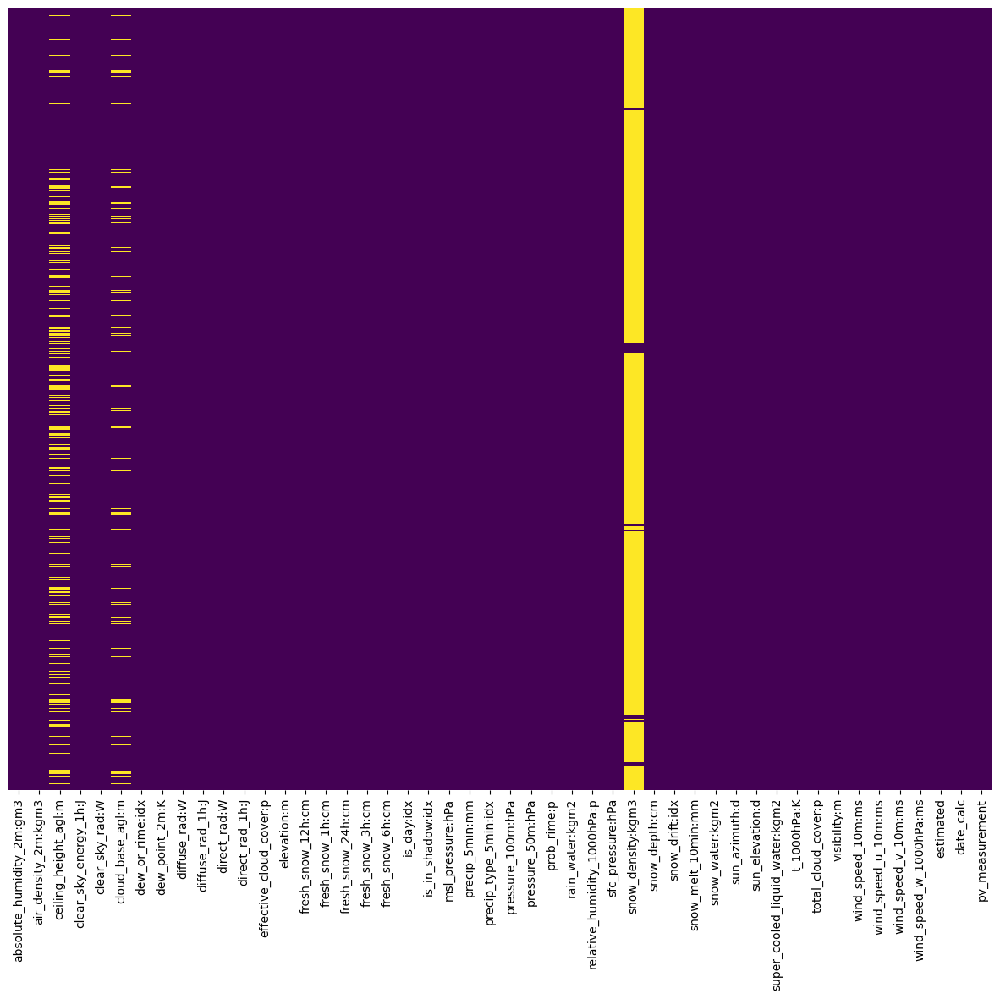

In [39]:
plt.figure(figsize=(15, 12))
sns.heatmap(train_all_a.isnull(), yticklabels = False, cbar = False, cmap = "viridis")

<AxesSubplot:>

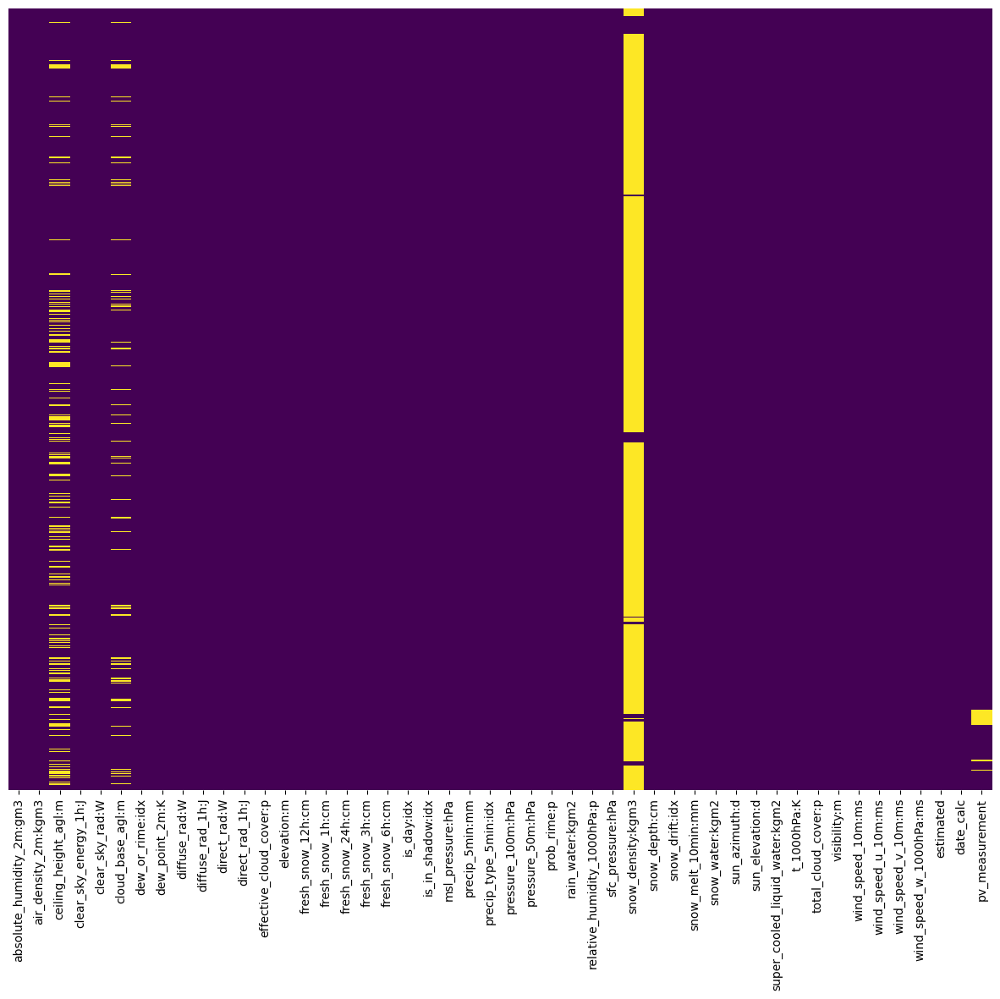

In [40]:
plt.figure(figsize=(15, 12))
sns.heatmap(train_all_b.isnull(), yticklabels = False, cbar = False, cmap = "viridis")

<AxesSubplot:>

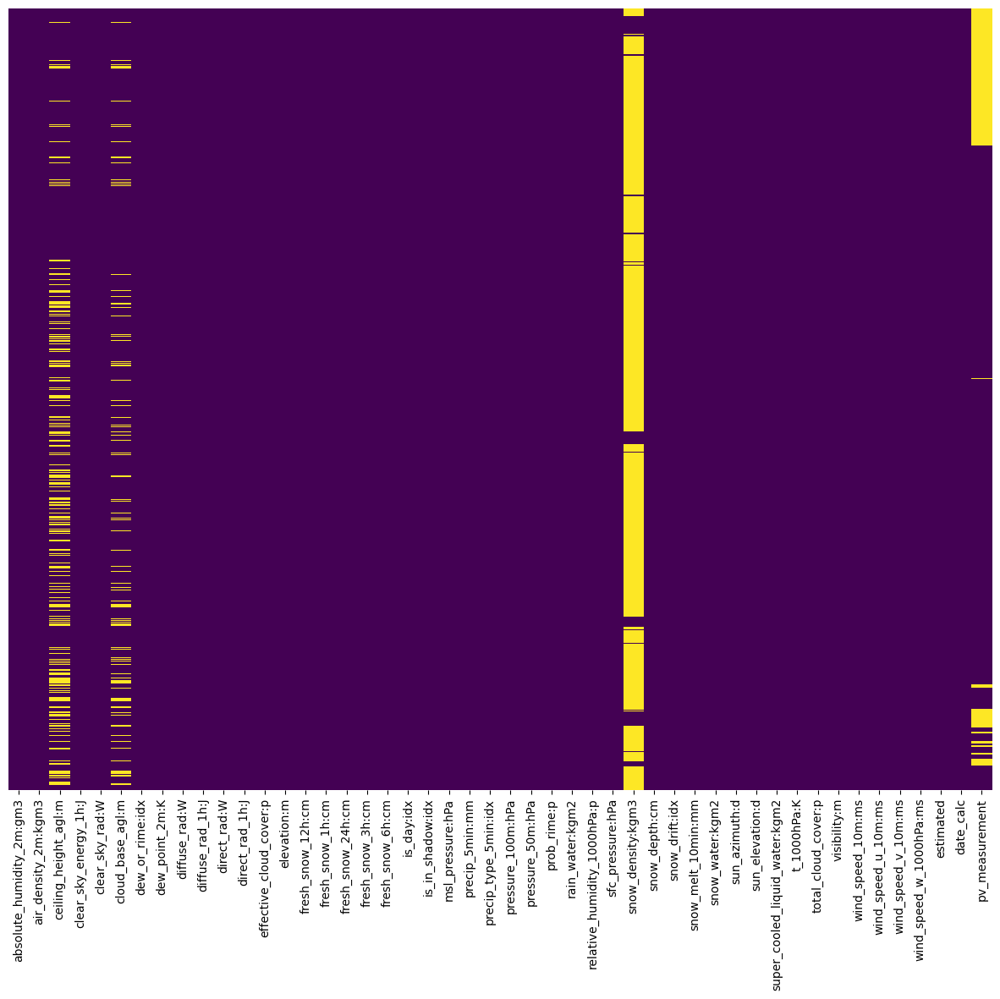

In [44]:
plt.figure(figsize=(15, 12))
sns.heatmap(train_all_c.isnull(), yticklabels = False, cbar = False, cmap = "viridis")

 - Snow density has only 6266 non-null values. The column can most likley be dropped without any consequences. 
 - ceiling_height_agl:m is more tricky as 21000 out of 101290 rows are missing data. We can choose to fill those rows with something like an average, or choose to drop the column completly. Both option should be tested against the models
- Cloud base has relativly few missing rows (~9000), so the col should not be dropped, as it has ~0.1 correlation to the pv measurements. Filling in the values somehow is preferred
 


For an XGBoost alogrithim, it all these Nan values can be kept

In [45]:
train_all = train_all.drop(["snow_density:kgm3"], axis=1)

In [46]:
#Naivly remove the ceiling_height_agl:m column to begin with
train_all = train_all.drop(["ceiling_height_agl:m"], axis=1)